<a href="https://colab.research.google.com/github/pekka1112/Project_EDM/blob/main/emd_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [40]:
# 0. Thực hiện import các thư viện
from sklearn import svm, datasets
from sklearn.model_selection import GridSearchCV;
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker
from sklearn import metrics
from sklearn.model_selection import train_test_split
import matplotlib.pylab as plt
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
from prettytable import PrettyTable
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.naive_bayes import CategoricalNB
from sklearn.naive_bayes import GaussianNB

from sklearn.svm import SVC
from sklearn.feature_selection import RFE

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.preprocessing import KBinsDiscretizer # chia các biến liên tục thành các khoảng rời rạc
from sklearn.impute import SimpleImputer # xử lí các missing value
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline
from sklearn.neural_network import MLPClassifier
from prettytable import PrettyTable

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.constraints import max_norm
from tensorflow.keras.optimizers import SGD

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout


In [ ]:
# 1. Kết nối GG Drive
from google.colab import drive
drive.mount('/content/gdrive')
%cd '/content/gdrive/MyDrive/ML_2024/Project/Dataset_EDM'


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/MyDrive/ML_2024/Project/Dataset_EDM


In [47]:
# 2. Tải lên tập dữ liệu
train_edmdataset = pd.read_csv('train_data_final.csv')
test_edmdataset = pd.read_csv('test_data_final.csv')

X_train = train_edmdataset.iloc[:, :-1]
y_train = train_edmdataset.iloc[:, -1]

X_test = test_edmdataset.iloc[:, :-1]
y_test = test_edmdataset.iloc[:, -1]

In [ ]:
columns = train_edmdataset.columns
fig, axes = plt.subplots(len(columns), 1, figsize=(20, len(columns) * 5))
for i, column in enumerate(columns):
    sns.histplot(train_edmdataset[column], kde=True, ax=axes[i], color='blue')
    axes[i].set_title(f'Train Data Distribution - {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')
plt.tight_layout()
plt.show()

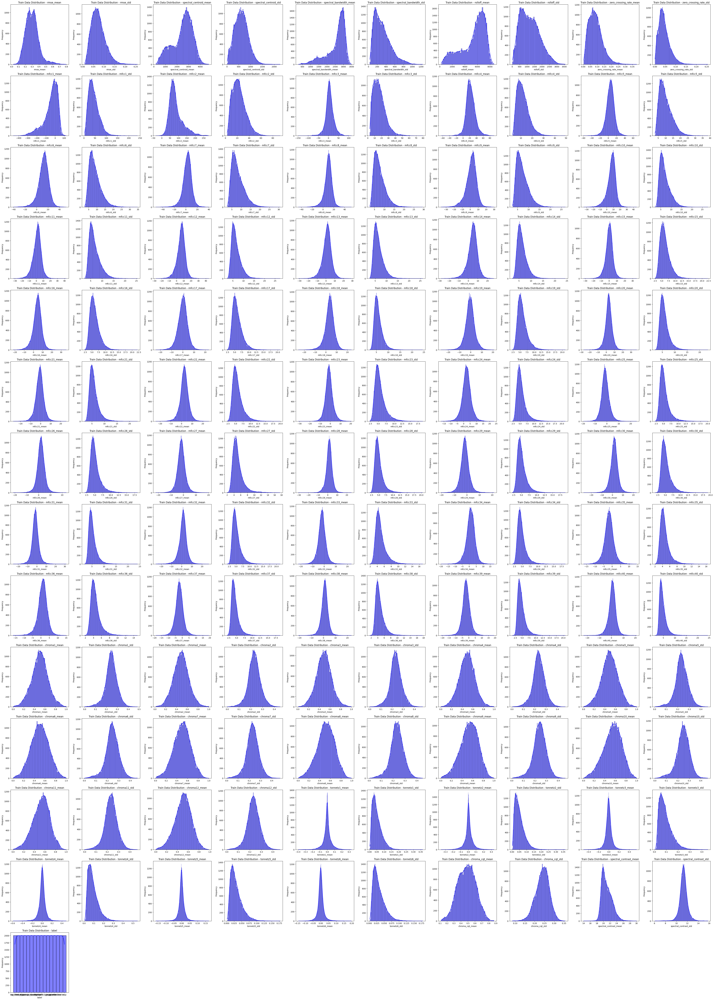

In [ ]:
# Phân bố dữ liệu
num_cols = 10
num_rows = int(np.ceil(len(columns) / num_cols))  # Tính số hàng cần thiết

fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 5))

for i, column in enumerate(columns):
    row = i // num_cols
    col = i % num_cols
    sns.histplot(train_edmdataset[column], kde=True, ax=axes[row, col], color='blue')
    axes[row, col].set_title(f'Train Data Distribution - {column}')
    axes[row, col].set_xlabel(column)
    axes[row, col].set_ylabel('Frequency')

for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes.flat[j])

plt.tight_layout()
plt.show()

Tiền xử lí dữ liệu bằng Feature Selection - RFE

In [21]:
rfe_model = RandomForestClassifier()

rfe = RFE(rfe_model, n_features_to_select=10)
fit = rfe.fit(X_train, y_train)

selected_features = X_train.columns[fit.support_]

X_train_rfe = X_train[selected_features]
X_test_rfe = X_test[selected_features]


In [26]:
# SVM
table = PrettyTable()
table.field_names = ["Algorithm Name ", "Accurancy", "Precision", "Recall", "F1"]

scaler = StandardScaler()
X_train_rfe_scaled = scaler.fit_transform(X_train_rfe)
X_test_rfe_scaled = scaler.transform(X_test_rfe)

svm_model = SVC(kernel='linear')
svm_model.fit(X_train_rfe_scaled, y_train)

y_pred_svm = svm_model.predict(X_test_rfe_scaled)

svm_acc = accuracy_score(y_test, y_pred_svm)
svm_pre = precision_score(y_test, y_pred_svm, average="macro")
svm_rec = recall_score(y_test, y_pred_svm, average="macro")
svm_f1 = f1_score(y_test, y_pred_svm, average="macro")
table.add_row(["SVM", svm_acc, svm_pre, svm_rec, svm_f1])
print(table)

+-----------------+-----------+--------------------+--------------------+--------------------+
| Algorithm Name  | Accurancy |     Precision      |       Recall       |         F1         |
+-----------------+-----------+--------------------+--------------------+--------------------+
|       SVM       |  0.61925  | 0.6204901657944892 | 0.6192500000000001 | 0.6152686246495229 |
+-----------------+-----------+--------------------+--------------------+--------------------+


In [ ]:
param_grid_svm = {
    'C': [0.1, 1],
    'gamma': [1, 0.1],
    'kernel': ['poly', 'sigmoid'],
    'degree': [2, 3],
}
svm_model = SVC()
grid = GridSearchCV(svm_model, param_grid_svm, refit=True, verbose=2)
grid.fit(X_train_rfe_scaled, y_train)

In [27]:
# kNN
table = PrettyTable()
table.field_names = ["Algorithm Name ", "Accurancy", "Precision", "Recall", "F1"]

knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train_rfe_scaled, y_train)

y_pred_knn = knn_model.predict(X_test_rfe_scaled)

knn_acc = accuracy_score(y_test, y_pred_knn)
knn_pre = precision_score(y_test, y_pred_knn, average="macro")
knn_rec = recall_score(y_test, y_pred_knn, average="macro")
knn_f1 = f1_score(y_test, y_pred_knn, average="macro")
table.add_row(["kNN", knn_acc, knn_pre, knn_rec, knn_f1])
print(table)

+-----------------+-----------+--------------------+--------------------+--------------------+
| Algorithm Name  | Accurancy |     Precision      |       Recall       |         F1         |
+-----------------+-----------+--------------------+--------------------+--------------------+
|       kNN       |  0.570375 | 0.5777630304364219 | 0.5703750000000001 | 0.5671438558045896 |
+-----------------+-----------+--------------------+--------------------+--------------------+


In [29]:
# kNN Fine-tune
param_grid_knn = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}
knn_model = KNeighborsClassifier()
grid_knn = GridSearchCV(knn_model, param_grid_knn, refit=True, verbose=2, cv=5)
grid_knn.fit(X_train_rfe_scaled, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END ...metric=euclidean, n_neighbors=3, weights=uniform; total time=   1.1s
[CV] END ...metric=euclidean, n_neighbors=3, weights=uniform; total time=   1.0s
[CV] END ...metric=euclidean, n_neighbors=3, weights=uniform; total time=   1.0s
[CV] END ...metric=euclidean, n_neighbors=3, weights=uniform; total time=   1.0s
[CV] END ...metric=euclidean, n_neighbors=3, weights=uniform; total time=   1.1s
[CV] END ..metric=euclidean, n_neighbors=3, weights=distance; total time=   0.7s
[CV] END ..metric=euclidean, n_neighbors=3, weights=distance; total time=   1.0s
[CV] END ..metric=euclidean, n_neighbors=3, weights=distance; total time=   1.1s
[CV] END ..metric=euclidean, n_neighbors=3, weights=distance; total time=   1.1s
[CV] END ..metric=euclidean, n_neighbors=3, weights=distance; total time=   1.1s
[CV] END ...metric=euclidean, n_neighbors=5, weights=uniform; total time=   1.3s
[CV] END ...metric=euclidean, n_neighbors=5, wei

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 5, 7],
                         'weights': ['uniform', 'distance']},
             verbose=2)

In [54]:
# Neural Network


table = PrettyTable()
table.field_names = ["Algorithm Name ", "Accurancy", "Precision", "Recall", "F1"]

# note : y_train và y_test ban đầu là chuỗi và cần chuyển thành số nguyên int
label_encoder = LabelEncoder()
y_train_int = label_encoder.fit_transform(y_train)
y_test_int = label_encoder.fit_transform(y_test)
# done : chuẩn hóa X_train và X_test
# note : chuyển đổi nhãn số nguyên thành one-hot encoding
num_classes = len(label_encoder.classes_)
y_train_int_cate = to_categorical(y_train_int, num_classes)
y_test_int_cate = to_categorical(y_test_int, num_classes)

nn_model = Sequential()
nn_model.add(Dense(128, activation='relu', input_shape=(X_train_rfe_scaled.shape[1],)))
nn_model.add(Dropout(0.5))
nn_model.add(Dense(64, activation='relu'))
nn_model.add(Dropout(0.5))
nn_model.add(Dense(num_classes, activation='softmax'))

nn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

nn_model.fit(X_train_rfe_scaled, y_train_int_cate, epochs=50, batch_size=32, validation_split=0.2)

y_pred_nn_probs = nn_model.predict(X_test_rfe_scaled)
y_pred_int = y_pred_nn_probs.argmax(axis=1)
# note : chuyển đổi nhãn dự đoán và nhãn thực tế từ số nguyên về chuỗi
y_test_string = label_encoder.inverse_transform(y_test_int)
y_pred_string = label_encoder.inverse_transform(y_pred_int)

nn_acc = accuracy_score(y_test_string, y_pred_string)
nn_pre = precision_score(y_test_string, y_pred_string, average="macro")
nn_rec = recall_score(y_test_string, y_pred_string, average="macro")
nn_f1 = f1_score(y_test_string, y_pred_string, average="macro")
table.add_row(["Neural Network", nn_acc, nn_pre, nn_rec, nn_f1])
print(table)


Epoch 1/50
800/800 [==============================] - 3s 3ms/step - loss: 1.4805 - accuracy: 0.5067 - val_loss: 8.7447 - val_accuracy: 0.0234
Epoch 2/50
800/800 [==============================] - 2s 2ms/step - loss: 1.1027 - accuracy: 0.6325 - val_loss: 10.3475 - val_accuracy: 0.0217
Epoch 3/50
800/800 [==============================] - 3s 3ms/step - loss: 1.0177 - accuracy: 0.6637 - val_loss: 11.3898 - val_accuracy: 0.0269
Epoch 4/50
800/800 [==============================] - 3s 4ms/step - loss: 0.9803 - accuracy: 0.6815 - val_loss: 12.3474 - val_accuracy: 0.0298
Epoch 5/50
800/800 [==============================] - 2s 3ms/step - loss: 0.9429 - accuracy: 0.6905 - val_loss: 13.6409 - val_accuracy: 0.0333
Epoch 6/50
800/800 [==============================] - 2s 3ms/step - loss: 0.9206 - accuracy: 0.6964 - val_loss: 13.6051 - val_accuracy: 0.0336
Epoch 7/50
800/800 [==============================] - 2s 3ms/step - loss: 0.8999 - accuracy: 0.7031 - val_loss: 14.5693 - val_accuracy: 0.0328


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Neural Network Fine-tune

def create_model(optimizer='adam', neurons=128):
    model = Sequential()
    model.add(Dense(neurons, activation='relu', input_shape=(X_train_scaled.shape[1],)))
    model.add(Dropout(0.5))
    model.add(Dense(neurons//2, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model = KerasClassifier(build_fn=create_model, epochs=10, batch_size=32, verbose=0)

param_grid = {
    'optimizer': ['adam', 'rmsprop'],
    'neurons': [64, 128, 256],
    'batch_size': [32, 64],
    'epochs': [50, 100]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
grid_result = grid.fit(X_train_scaled, y_train_categorical)

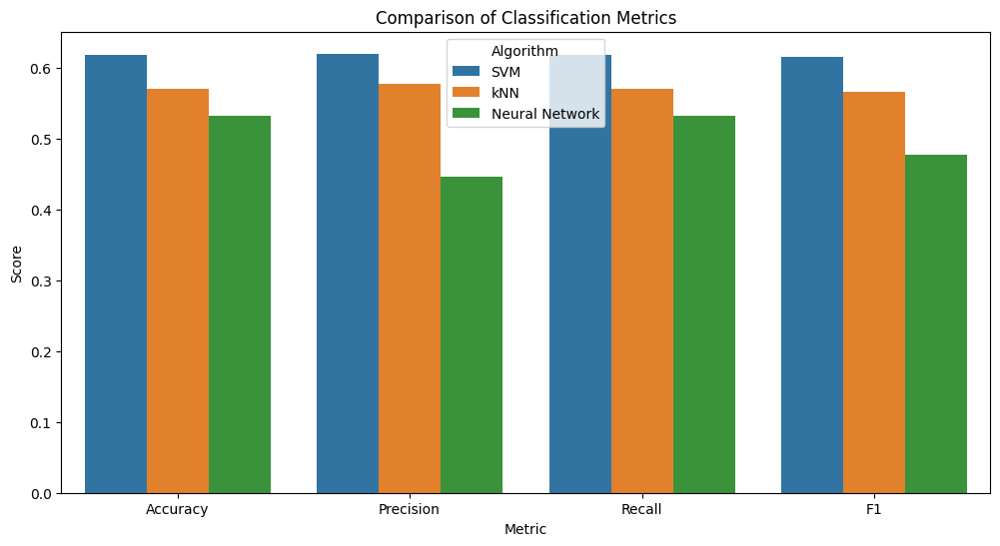

In [56]:
# TASK : SO SÁNH KẾT QUẢ CÁC THUẬT TOÁN VỚI NHAU

data = {
    'Algorithm': ['SVM', 'kNN', 'Neural Network'],
    'Accuracy': [svm_acc, knn_acc, nn_acc],
    'Precision': [svm_pre, knn_pre, nn_pre],
    'Recall': [svm_rec, knn_rec, nn_rec],
    'F1': [svm_f1, knn_f1, nn_f1]
}
# note : dataframe chứa các chỉ số hiệu suất
df = pd.DataFrame(data)
df_melted = df.melt(id_vars='Algorithm', var_name='Metric', value_name='Score')

# note : thực hiện vẽ biểu đồ so sánh
plt.figure(figsize=(12, 6))
sns.barplot(data=df_melted, x='Metric', y='Score', hue='Algorithm')
plt.title('Comparison of Classification Metrics')
plt.ylabel('Score')
plt.xlabel('Metric')
plt.legend(title='Algorithm')
plt.show()
